<a href="https://colab.research.google.com/github/dah4ik/GenAI-Project/blob/main/%22test_model_ipynb%22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:


!pip uninstall -y torch torchvision torchaudio
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1

!pip install -q diffusers transformers accelerate
!pip install -q ultralytics==8.1.0
!pip install -q autodistill autodistill-grounding-dino roboflow

print("Libraries installed. PLEASE RESTART RUNTIME!")

Found existing installation: torch 2.5.1
Uninstalling torch-2.5.1:
  Successfully uninstalled torch-2.5.1
Found existing installation: torchvision 0.20.1
Uninstalling torchvision-0.20.1:
  Successfully uninstalled torchvision-0.20.1
Found existing installation: torchaudio 2.5.1
Uninstalling torchaudio-2.5.1:
  Successfully uninstalled torchaudio-2.5.1
  Using cached torch-2.5.1-cp312-cp312-manylinux1_x86_64.whl.metadata (28 kB)
  Using cached torchvision-0.20.1-cp312-cp312-manylinux1_x86_64.whl.metadata (6.1 kB)
  Using cached torchaudio-2.5.1-cp312-cp312-manylinux1_x86_64.whl.metadata (6.4 kB)
Using cached torch-2.5.1-cp312-cp312-manylinux1_x86_64.whl (906.4 MB)
Using cached torchvision-0.20.1-cp312-cp312-manylinux1_x86_64.whl (7.2 MB)
Using cached torchaudio-2.5.1-cp312-cp312-manylinux1_x86_64.whl (3.4 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.2/699.2 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [6]:
# FIX: Downgrade PyTorch to a YOLOv8-compatible version

!pip uninstall -y torch torchvision torchaudio
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1

Found existing installation: torch 2.9.0+cu126
Uninstalling torch-2.9.0+cu126:
  Successfully uninstalled torch-2.9.0+cu126
Found existing installation: torchvision 0.24.0+cu126
Uninstalling torchvision-0.24.0+cu126:
  Successfully uninstalled torchvision-0.24.0+cu126
Found existing installation: torchaudio 2.9.0+cu126
Uninstalling torchaudio-2.9.0+cu126:
  Successfully uninstalled torchaudio-2.9.0+cu126
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.4/906.4 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 102.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 128.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 136.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [8]:
# ==============================
# Block 1: Mount Google Drive & create project folders
# ==============================

from google.colab import drive
import os

drive.mount('/content/drive')

PROJECT_ROOT = "/content/drive/MyDrive/ChildSafetyProject_SDXL"

RAW_IMAGES_DIR = os.path.join(PROJECT_ROOT, "raw_images")
YOLO_DATASET_DIR = os.path.join(PROJECT_ROOT, "yolo_dataset")

os.makedirs(RAW_IMAGES_DIR, exist_ok=True)
os.makedirs(YOLO_DATASET_DIR, exist_ok=True)

print("Project folders created:")
print(PROJECT_ROOT)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Project folders created:
/content/drive/MyDrive/ChildSafetyProject_SDXL


In [ ]:
# ==============================
# Block 3: SDXL image generation (children rooms)
# ==============================

import torch
from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler
import os
import random

MODEL_ID = "stabilityai/stable-diffusion-xl-base-1.0"

pipe = StableDiffusionXLPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

pipe.enable_model_cpu_offload()
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

NEGATIVE_PROMPT = (
    "cartoon, illustration, drawing, anime, low quality, blurry, "
    "distorted, unrealistic, deformed, extra objects"
)

prompts = {
    "scissors": [
        "A realistic photo of a child's bedroom with toys and a bed, "
        "sharp metal scissors lying on the floor near colorful toys, "
        "natural daylight, photorealistic"
    ],
    "battery": [
        "A realistic nursery room with toys, "
        "a small button battery on the carpet near children's toys, "
        "natural lighting, photorealistic"
    ],
    "detergent": [
        "A realistic children's playroom, "
        "a colorful detergent bottle on a low shelf within child's reach, "
        "natural light, photorealistic"
    ],
    "wires": [
        "A realistic child's bedroom with toys, "
        "a damaged electrical power cord with exposed wires on the floor, "
        "natural lighting, realistic photo"
    ]
}

IMAGES_PER_CLASS = 25

for label, plist in prompts.items():
    for i in range(IMAGES_PER_CLASS):
        image = pipe(
            prompt=random.choice(plist),
            negative_prompt=NEGATIVE_PROMPT,
            num_inference_steps=30,
            guidance_scale=7.0,
            height=1024,
            width=1024
        ).images[0]

        image.save(os.path.join(RAW_IMAGES_DIR, f"{label}_{i}.jpg"))

print("SDXL image generation completed.")


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

SDXL image generation completed.


In [ ]:
# ==============================
# Block 4: Automatic labeling
# ==============================

from autodistill_grounding_dino import GroundingDINO
from autodistill.detection import CaptionOntology
import os

# Ensure PROJECT_ROOT, RAW_IMAGES_DIR, YOLO_DATASET_DIR are defined for standalone execution
# This assumes Google Drive is already mounted (from a previous cell or manually).
PROJECT_ROOT = "/content/drive/MyDrive/ChildSafetyProject_SDXL"
RAW_IMAGES_DIR = os.path.join(PROJECT_ROOT, "raw_images")
YOLO_DATASET_DIR = os.path.join(PROJECT_ROOT, "yolo_dataset")
os.makedirs(RAW_IMAGES_DIR, exist_ok=True)
os.makedirs(YOLO_DATASET_DIR, exist_ok=True)

ontology = CaptionOntology({
    "scissors": "Sharp Object",
    "battery": "Choking Hazard",
    "detergent bottle": "Chemical Danger",
    "exposed electrical wire": "Electrical Hazard"
})

model = GroundingDINO(ontology=ontology)

model.label(
    input_folder=RAW_IMAGES_DIR,
    output_folder=YOLO_DATASET_DIR,
    extension=".jpg"
)

print("Labeling completed.")

# --- Added check ---
# Verify if images were actually written to the YOLO_DATASET_DIR/images directory
output_images_path = os.path.join(YOLO_DATASET_DIR, "images")
if os.path.exists(output_images_path):
    labeled_images = [f for f in os.listdir(output_images_path) if f.endswith(".jpg")]
    print(f"Found {len(labeled_images)} labeled images in {output_images_path} after labeling.")
    if not labeled_images:
        print("WARNING: The labeled images directory is empty. This might cause issues in subsequent steps.")
else:
    print(f"WARNING: The output images directory {output_images_path} was not created.")


trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Labeling /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_0.jpg:   0%|          | 0/100 [00:00<?, ?it/s]The `device` argument 

Found /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/images/scissors_5.jpg as already present, not moving anything to /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/images
Found /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/labels/scissors_5.txt as already present, not moving anything to /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/labels
Found /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/images/battery_10.jpg as already present, not moving anything to /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/images
Found /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/labels/battery_10.txt as already present, not moving anything to /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/labels
Found /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/images/detergent_23.jpg as already present, not moving anything to /content/drive/MyDriv

In [ ]:
 #==============================
# Block 5: Train/Val split
# ==============================

import os, shutil, random
random.seed(42)

images_dir = os.path.join(YOLO_DATASET_DIR, "images")
labels_dir = os.path.join(YOLO_DATASET_DIR, "labels")

for s in ["train", "val"]:
    os.makedirs(os.path.join(images_dir, s), exist_ok=True)
    os.makedirs(os.path.join(labels_dir, s), exist_ok=True)

imgs = [f for f in os.listdir(images_dir) if f.endswith(".jpg")]
random.shuffle(imgs)

split = int(0.8 * len(imgs))
train, val = imgs[:split], imgs[split:]

def move(imgs, split):
    for img in imgs:
        shutil.move(os.path.join(images_dir, img), os.path.join(images_dir, split, img))
        shutil.move(
            os.path.join(labels_dir, img.replace(".jpg", ".txt")),
            os.path.join(labels_dir, split, img.replace(".jpg", ".txt"))
        )

move(train, "train")
move(val, "val")

print("Train/Val split done.")


Train/Val split done.


In [9]:
# ==============================
# Block 6: Create data.yaml
# ==============================

import yaml
import os

yaml_path = os.path.join(YOLO_DATASET_DIR, "data.yaml")

data = {
    "path": YOLO_DATASET_DIR,
    "train": "train/images",  # Corrected path based on Autodistill's output structure
    "val": "valid/images",    # Corrected path based on Autodistill's output structure
    "names": [
        "Sharp Object",
        "Choking Hazard",
        "Chemical Danger",
        "Electrical Hazard"
    ]
}

with open(yaml_path, "w") as f:
    yaml.dump(data, f)

print("data.yaml created.")


data.yaml created.


In [14]:
# ==============================
# Block 7: Train YOLOv8
# ==============================

from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=8,
    device=0,
    project="child_safety_project_sdxl", # Changed from PROJECT_ROOT to a valid project name
    name="yolov8_child_safety_sdxl"
)

print("Training finished.")


New https://pypi.org/project/ultralytics/8.3.240 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/data.yaml, epochs=50, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=child_safety_project_sdxl, name=yolov8_child_safety_sdxl2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnost

/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  1    123648  ultralytics.nn.modules.block.C2f             [192, 128, 1]                 
 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    752092  ultralytics.nn.modules.head.Detect           [4, [64, 128, 256]]           
Model summary: 225 layers, 3011628 parameters, 3011612 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir child_safety_project_sdxl/yo

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: gavrissveta (gavrissveta-hit) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


AMP: checks passed ✅


/usr/local/lib/python3.12/dist-packages/ultralytics/engine/trainer.py:271: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/train/labels.cache... 94 images, 5 backgrounds, 0 corrupt: 100%|██████████| 94/94 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:847: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()
val: Scanning /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/valid/labels.cache... 34 images, 2 backgrounds, 0 corrupt: 100%|██████████| 34/34 [00:00<?, ?it/s]


Plotting labels to child_safety_project_sdxl/yolov8_child_safety_sdxl2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.17G      1.063      3.999      1.033         28        640: 100%|██████████| 12/12 [00:22<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all         34        229    0.00226      0.181     0.0167     0.0135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.25G     0.9516      3.127      1.011         48        640: 100%|██████████| 12/12 [00:03<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

                   all         34        229     0.0199      0.355      0.196      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       1.2G     0.9718      2.534     0.9966         64        640: 100%|██████████| 12/12 [00:03<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.87it/s]

                   all         34        229     0.0286       0.53      0.252      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       1.2G     0.9468      2.333      1.009        121        640: 100%|██████████| 12/12 [00:02<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.37it/s]

                   all         34        229     0.0247      0.558      0.258      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       1.2G     0.9015      1.872     0.9878         44        640: 100%|██████████| 12/12 [00:03<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.40it/s]

                   all         34        229      0.713      0.161       0.31      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.21G     0.9322      1.965       1.01         28        640: 100%|██████████| 12/12 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.29it/s]

                   all         34        229      0.634      0.208      0.284      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.18G     0.9445      1.787      1.001         42        640: 100%|██████████| 12/12 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.16it/s]

                   all         34        229      0.525      0.274      0.264      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.26G     0.9604      1.654      1.008         75        640: 100%|██████████| 12/12 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.22it/s]


                   all         34        229      0.463      0.242      0.243      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       1.2G      0.869      1.615     0.9846         52        640: 100%|██████████| 12/12 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.02it/s]

                   all         34        229      0.575      0.284      0.308       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       1.2G     0.8613      1.479      0.953         55        640: 100%|██████████| 12/12 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.79it/s]

                   all         34        229      0.634      0.298      0.344      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.18G     0.8486      1.546     0.9834         40        640: 100%|██████████| 12/12 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.45it/s]

                   all         34        229      0.707      0.324      0.378      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       1.2G     0.8528      1.701       1.01         37        640: 100%|██████████| 12/12 [00:02<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         34        229      0.652       0.38      0.398      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.26G     0.8632      1.666      0.992         80        640: 100%|██████████| 12/12 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.68it/s]

                   all         34        229      0.584      0.395      0.364        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.14G     0.8784      1.846      1.014         14        640: 100%|██████████| 12/12 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.38it/s]

                   all         34        229      0.604      0.347      0.387      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.14G     0.8105      1.707     0.9863         19        640: 100%|██████████| 12/12 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.80it/s]

                   all         34        229      0.744      0.352      0.407       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       1.2G     0.7881      1.484     0.9801         46        640: 100%|██████████| 12/12 [00:03<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.49it/s]

                   all         34        229      0.715      0.414      0.416      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.22G     0.8492      1.719     0.9742         26        640: 100%|██████████| 12/12 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.32it/s]

                   all         34        229      0.638      0.407      0.415      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.11G     0.8311      1.657     0.9919         33        640: 100%|██████████| 12/12 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all         34        229      0.624      0.403      0.413      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.23G     0.7835      1.488     0.9737         36        640: 100%|██████████| 12/12 [00:05<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         34        229      0.641      0.366      0.391       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.13G     0.7691      1.453     0.9395         51        640: 100%|██████████| 12/12 [00:03<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all         34        229      0.707      0.394      0.425      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.17G       0.78      1.502     0.9594         49        640: 100%|██████████| 12/12 [00:05<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         34        229      0.688      0.394      0.428      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       1.2G     0.8461      1.491     0.9804         67        640: 100%|██████████| 12/12 [00:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all         34        229      0.746      0.326      0.426      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.18G     0.7899      1.636      0.983         12        640: 100%|██████████| 12/12 [00:02<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.08it/s]

                   all         34        229      0.704      0.395      0.436      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.26G     0.7359      1.361     0.9338         49        640: 100%|██████████| 12/12 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.46it/s]

                   all         34        229      0.633      0.468      0.441      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.18G     0.7776      1.512     0.9428         45        640: 100%|██████████| 12/12 [00:01<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         34        229      0.701      0.444      0.462      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.15G     0.7504      1.546     0.9711         61        640: 100%|██████████| 12/12 [00:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.97it/s]

                   all         34        229      0.754      0.449      0.487      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.17G     0.7999      1.463     0.9507         43        640: 100%|██████████| 12/12 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.79it/s]

                   all         34        229      0.868      0.458      0.524      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.14G     0.7754      1.388     0.9537         32        640: 100%|██████████| 12/12 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.32it/s]

                   all         34        229      0.799      0.449      0.507      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.19G     0.7555      1.316     0.9117         34        640: 100%|██████████| 12/12 [00:02<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]

                   all         34        229      0.778      0.433      0.497      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.18G     0.6967      1.289     0.9268         30        640: 100%|██████████| 12/12 [00:03<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.14it/s]

                   all         34        229      0.809      0.449      0.513      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.21G      0.731      1.206      0.933         80        640: 100%|██████████| 12/12 [00:02<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.69it/s]

                   all         34        229      0.754      0.545      0.535      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.14G     0.6429      1.176     0.9128         18        640: 100%|██████████| 12/12 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.89it/s]

                   all         34        229      0.786      0.493      0.553      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.16G     0.6993       1.11     0.9154         64        640: 100%|██████████| 12/12 [00:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.95it/s]

                   all         34        229      0.843      0.518       0.57      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.17G     0.6516      1.183     0.9082         21        640: 100%|██████████| 12/12 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.17it/s]

                   all         34        229      0.829      0.492      0.584      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.25G     0.6897      1.093     0.8982         30        640: 100%|██████████| 12/12 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.33it/s]

                   all         34        229      0.868      0.524       0.59      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.17G     0.6337      1.052     0.9038         43        640: 100%|██████████| 12/12 [00:02<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.15it/s]

                   all         34        229      0.838      0.535      0.594      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.17G     0.6903      1.194     0.9027        115        640: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.58it/s]

                   all         34        229       0.76      0.592      0.598      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.14G     0.6724      1.226     0.9246         79        640: 100%|██████████| 12/12 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.84it/s]

                   all         34        229      0.815      0.576      0.598      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.19G     0.6875      1.235     0.9285         55        640: 100%|██████████| 12/12 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.91it/s]

                   all         34        229      0.869      0.485      0.591      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.18G     0.6668      1.284     0.9162         71        640: 100%|██████████| 12/12 [00:03<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]

                   all         34        229      0.846      0.524      0.593      0.515


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:847: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.14G     0.6199      1.072     0.8804         32        640: 100%|██████████| 12/12 [00:03<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.33it/s]

                   all         34        229       0.78      0.565      0.601      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.14G     0.5968      1.199     0.8952         19        640: 100%|██████████| 12/12 [00:02<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.24it/s]

                   all         34        229      0.798      0.561      0.609      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.15G     0.5552      1.067     0.8759         28        640: 100%|██████████| 12/12 [00:03<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.81it/s]

                   all         34        229      0.858      0.548      0.621      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.14G     0.5725      1.096     0.8757         32        640: 100%|██████████| 12/12 [00:01<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.65it/s]

                   all         34        229      0.872      0.567      0.631      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.15G     0.5941      1.125     0.8727         22        640: 100%|██████████| 12/12 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.81it/s]

                   all         34        229      0.922      0.553      0.634      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.14G      0.573      1.065     0.8859         66        640: 100%|██████████| 12/12 [00:02<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.00it/s]

                   all         34        229      0.932      0.557       0.64      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.14G     0.5733      1.104     0.8961         41        640: 100%|██████████| 12/12 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.79it/s]

                   all         34        229      0.912      0.594      0.648       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.18G     0.5279      1.103     0.8821         17        640: 100%|██████████| 12/12 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.28it/s]

                   all         34        229      0.942      0.593      0.653      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.14G     0.6056      1.136     0.8693         28        640: 100%|██████████| 12/12 [00:03<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.44it/s]

                   all         34        229      0.948       0.61      0.657      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.15G     0.5416       1.01      0.881         15        640: 100%|██████████| 12/12 [00:02<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.51it/s]

                   all         34        229      0.942      0.607      0.656      0.573



50 epochs completed in 0.077 hours.
Optimizer stripped from child_safety_project_sdxl/yolov8_child_safety_sdxl2/weights/last.pt, 6.3MB
Optimizer stripped from child_safety_project_sdxl/yolov8_child_safety_sdxl2/weights/best.pt, 6.3MB

Validating child_safety_project_sdxl/yolov8_child_safety_sdxl2/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]


                   all         34        229      0.948       0.61      0.657      0.575
          Sharp Object         34          1          1          0          0          0
        Choking Hazard         34         40      0.924       0.75      0.862      0.796
       Chemical Danger         34        171       0.94      0.924      0.966      0.874
     Electrical Hazard         34         17      0.927      0.765      0.799       0.63
Speed: 0.4ms preprocess, 5.1ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to child_safety_project_sdxl/yolov8_child_safety_sdxl2


lr/pg0,▂▃▄▅▆█████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁
lr/pg1,▂▃▄▄▅█████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁
lr/pg2,▂▃▄▄▅▇████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁
metrics/mAP50(B),▁▃▄▄▄▄▃▄▅▅▅▅▅▅▅▅▅▆▅▆▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇█████
metrics/mAP50-95(B),▁▃▃▃▄▃▃▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████
metrics/precision(B),▁▁▁▁▆▅▄▅▆▆▅▅▆▆▆▆▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████
metrics/recall(B),▁▄▇▇▁▃▂▃▃▄▅▄▄▅▅▄▅▅▆▅▆▅▅▅▇▇▆▇▇█▆▇▇▇▇▇▇███
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
+6,...


Training finished.


In [ ]:
# ==============================
# Block 8: Evaluation
# ==============================

metrics = model.val(data=yaml_path)

print(f"mAP50: {metrics.box.map50:.4f}")
print(f"mAP50-95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.p.mean():.4f}")
print(f"Recall: {metrics.box.r.mean():.4f}")


Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/ChildSafetyProject_SDXL/yolo_dataset/valid/labels.cache... 34 images, 2 backgrounds, 0 corrupt: 100%|██████████| 34/34 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]


                   all         34        229      0.947      0.587      0.655      0.589
          Sharp Object         34          1          1          0          0          0
        Choking Hazard         34         40      0.966        0.8      0.874      0.824
       Chemical Danger         34        171      0.945      0.899      0.958      0.885
     Electrical Hazard         34         17      0.878      0.647      0.786      0.647
Speed: 1.1ms preprocess, 37.3ms inference, 0.0ms loss, 20.7ms postprocess per image
Results saved to child_safety_project_sdxl/yolov8_child_safety_sdxl52
mAP50: 0.6547
mAP50-95: 0.5890
Precision: 0.9473
Recall: 0.5866



image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_0.jpg: 640x640 1 Electrical Hazard, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)


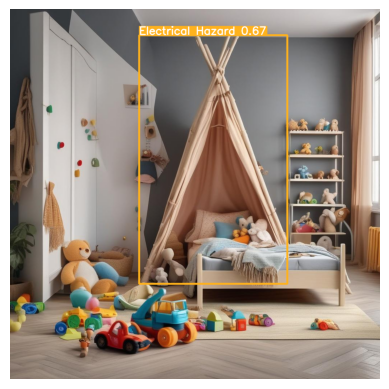


image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_1.jpg: 640x640 (no detections), 7.5ms
Speed: 4.6ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


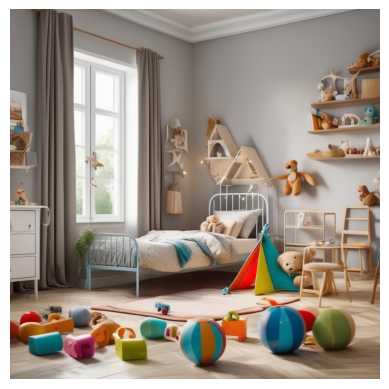


image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_2.jpg: 640x640 3 Choking Hazards, 1 Electrical Hazard, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


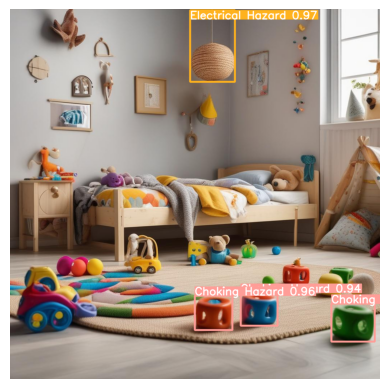


image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_3.jpg: 640x640 1 Choking Hazard, 13.3ms
Speed: 9.8ms preprocess, 13.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


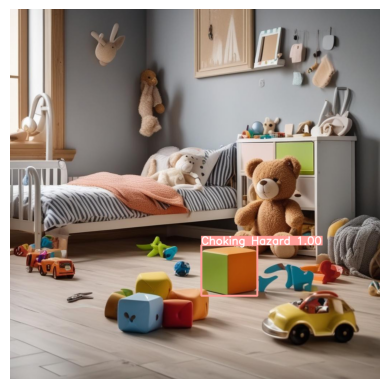


image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_4.jpg: 640x640 1 Chemical Danger, 1 Electrical Hazard, 12.8ms
Speed: 8.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


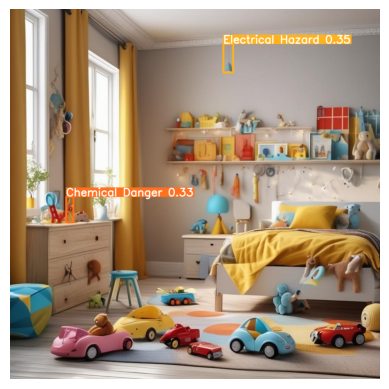

In [15]:
# ==============================
# Block 9: Inference visualization
# ==============================

import os
import matplotlib.pyplot as plt # Import matplotlib for displaying images

test_imgs = [os.path.join(RAW_IMAGES_DIR, f) for f in os.listdir(RAW_IMAGES_DIR)[:5]]

for img_path in test_imgs:
    results = model(img_path, conf=0.3)
    # Use .plot() to get the annotated image as a NumPy array
    # Then display it using matplotlib
    for r in results:
        im_array = r.plot()  # plot a BGR numpy array of predictions
        plt.imshow(im_array[..., ::-1])  # Convert BGR to RGB for matplotlib
        plt.axis('off') # Hide axes
        plt.show() # Display the image


Processing: /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_0.jpg

image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_0.jpg: 640x640 1 Electrical Hazard, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


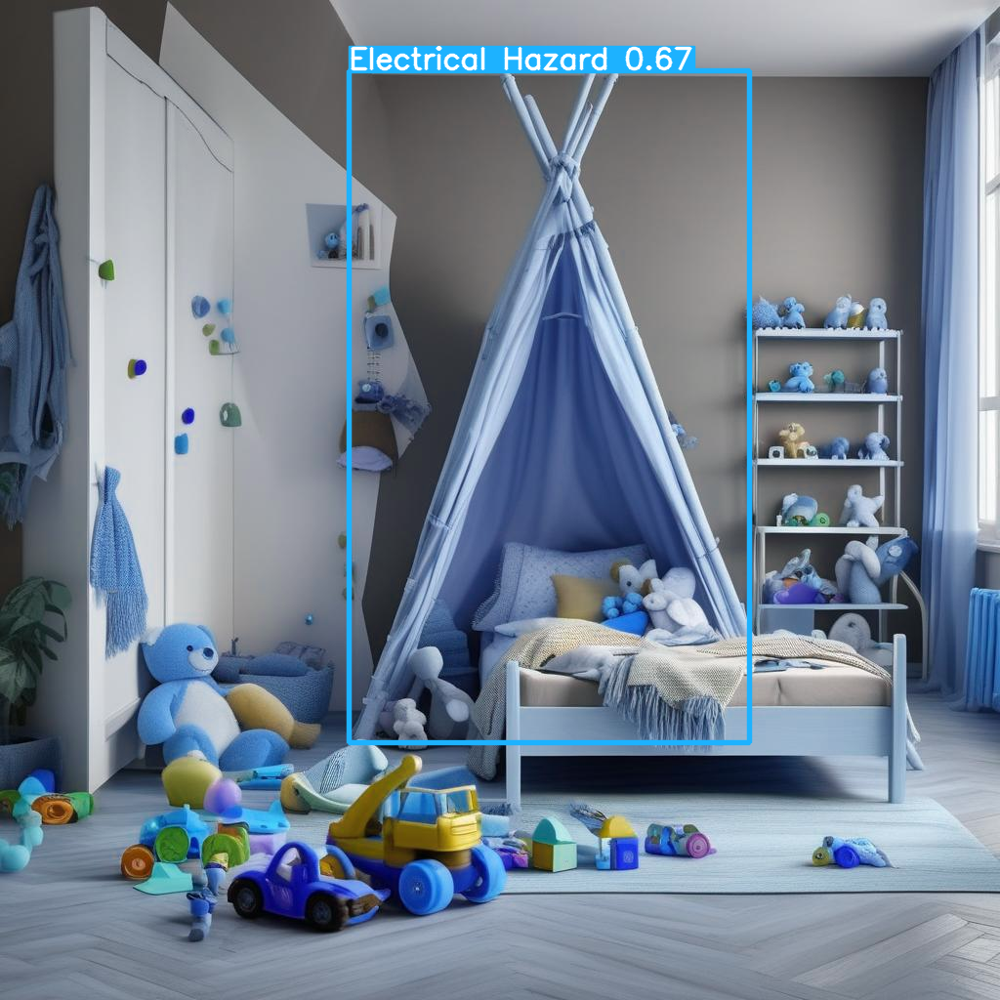

Processing: /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_1.jpg

image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_1.jpg: 640x640 (no detections), 10.5ms
Speed: 4.7ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


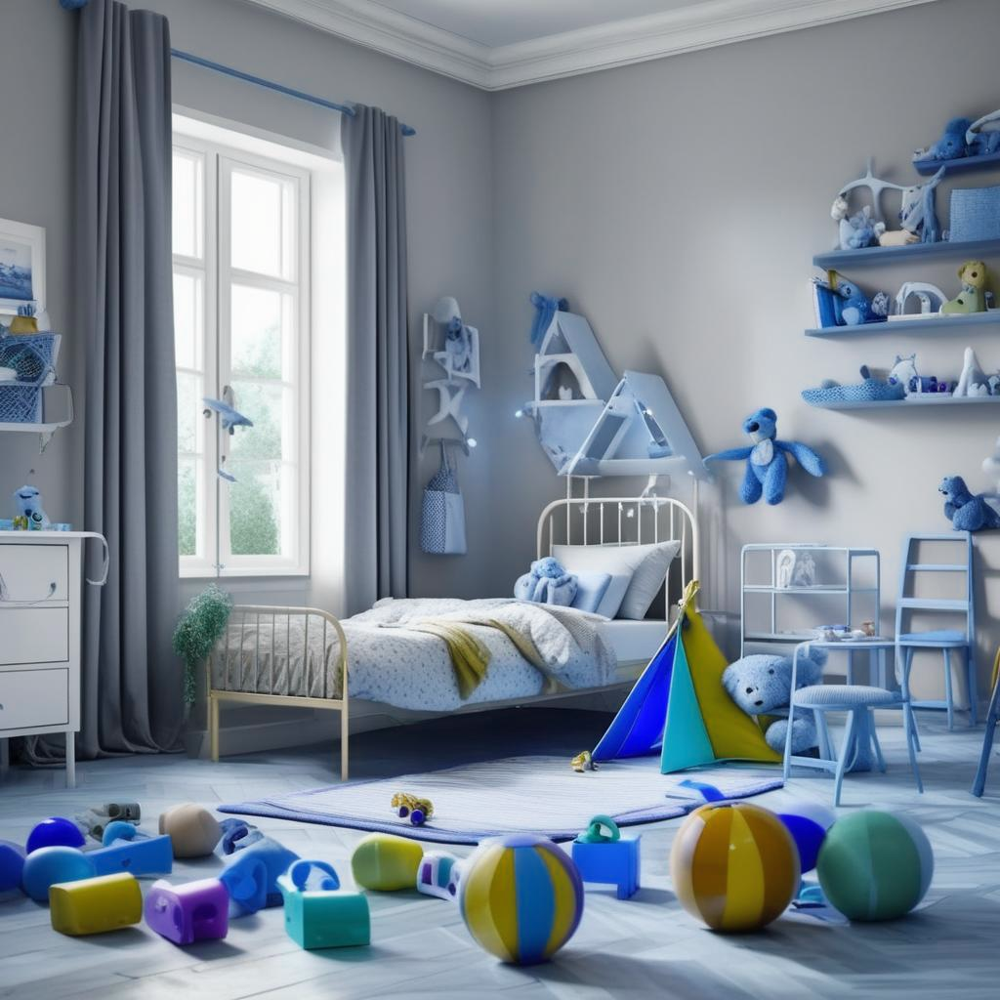

Processing: /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_2.jpg

image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_2.jpg: 640x640 3 Choking Hazards, 1 Electrical Hazard, 9.6ms
Speed: 4.6ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


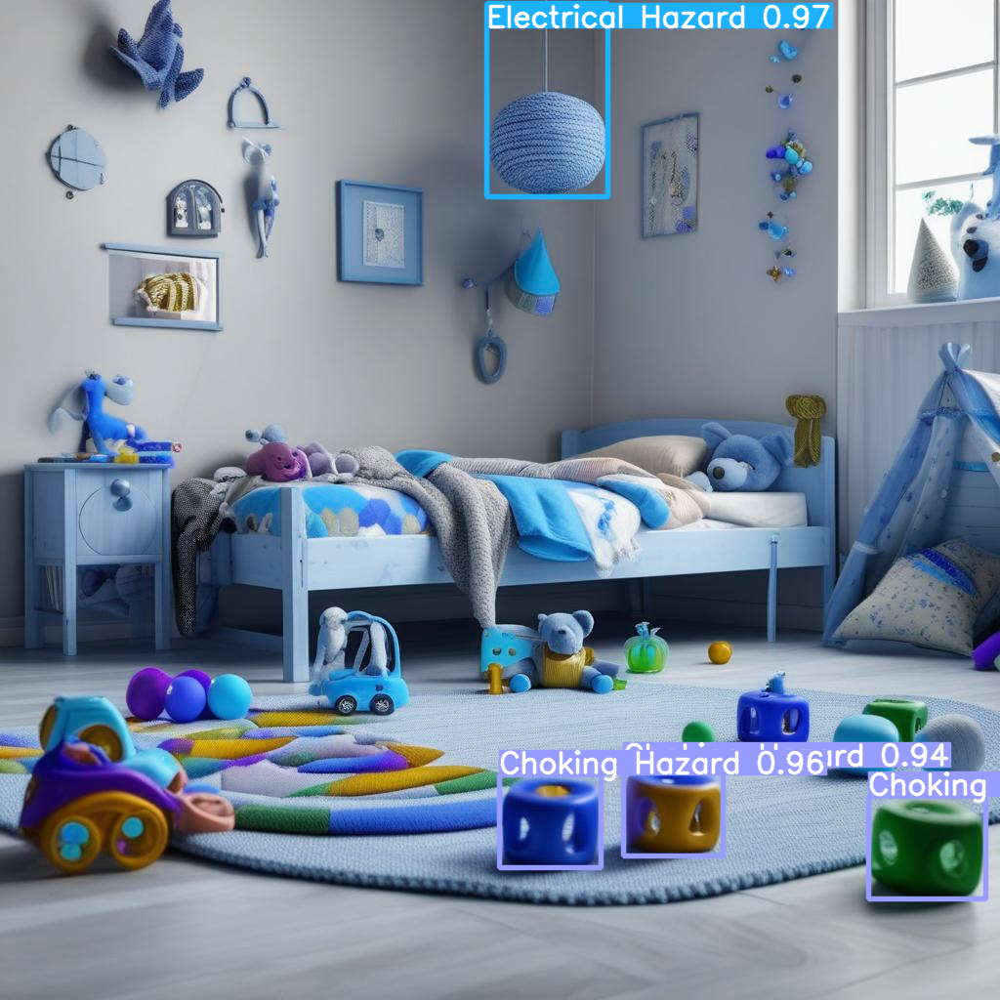

Processing: /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_3.jpg

image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_3.jpg: 640x640 1 Choking Hazard, 8.1ms
Speed: 4.8ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


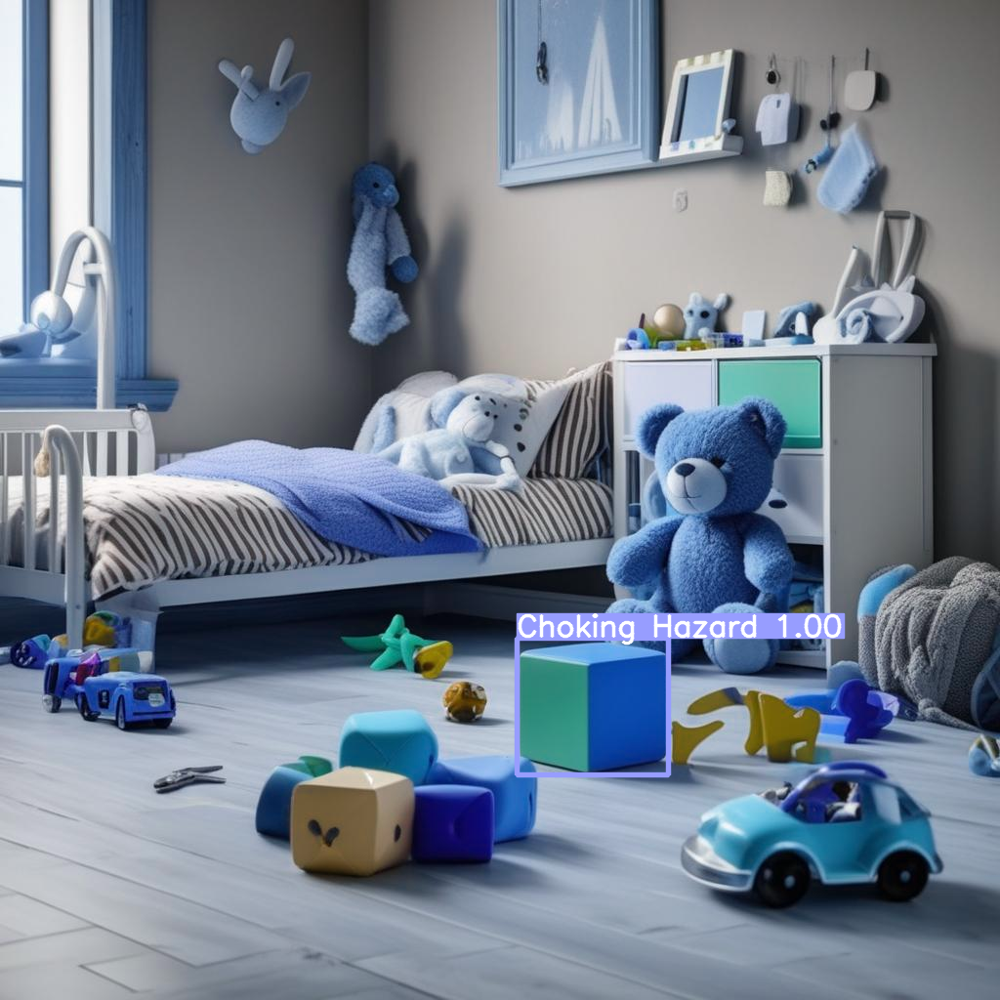

Processing: /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_4.jpg

image 1/1 /content/drive/MyDrive/ChildSafetyProject_SDXL/raw_images/scissors_4.jpg: 640x640 1 Chemical Danger, 1 Electrical Hazard, 8.5ms
Speed: 4.6ms preprocess, 8.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


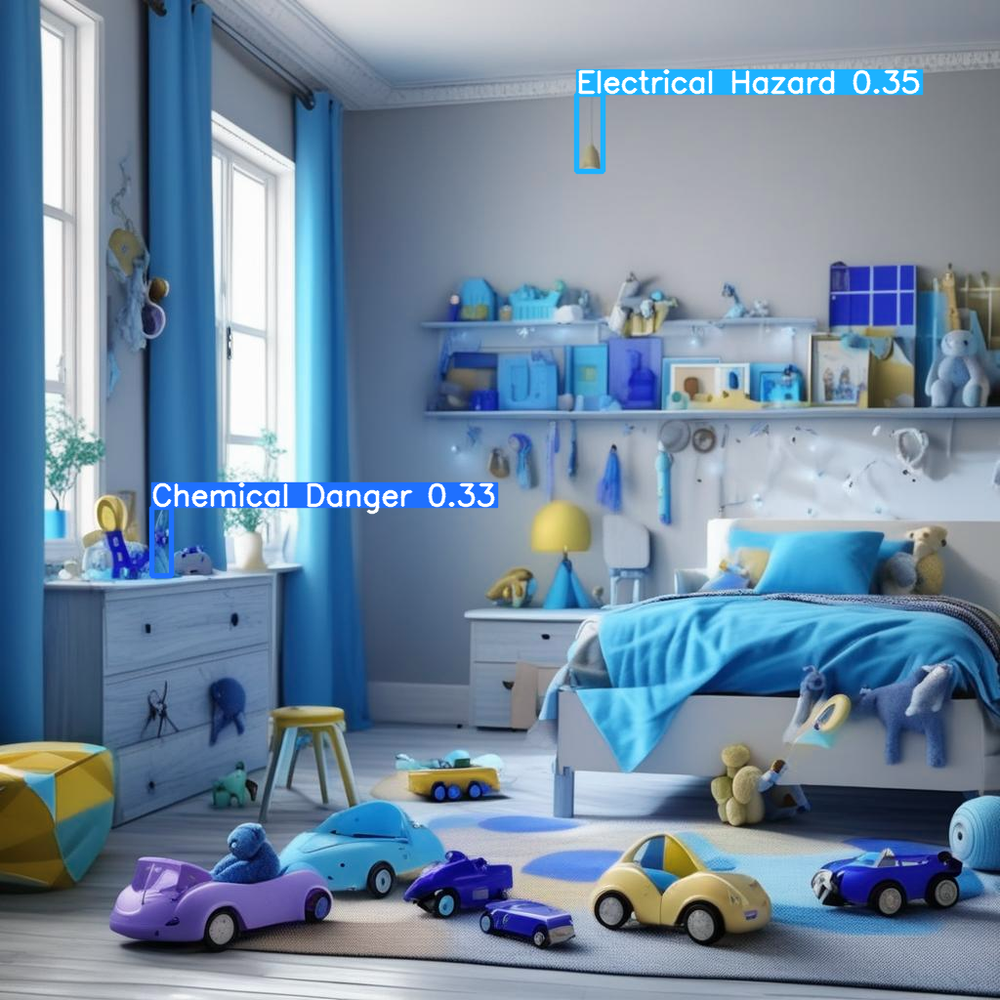

In [16]:
# ==============================
# BLOCK 9: Inference & visualization
# ==============================

from IPython.display import Image, display # Import Image from IPython.display
from PIL import Image as PILImage # Alias PIL.Image to avoid conflict with IPython.display.Image

test_images = [os.path.join(RAW_IMAGES_DIR, f) for f in os.listdir(RAW_IMAGES_DIR) if f.endswith(".jpg")][:5]

for img_path in test_images:
    print(f"Processing: {img_path}")
    results = model(img_path, conf=0.3)
    # Get the annotated image (numpy array)
    annotated_image_array = results[0].plot()
    # Convert numpy array to PIL Image
    annotated_image_pil = PILImage.fromarray(annotated_image_array)
    # Display the PIL Image
    display(annotated_image_pil)